## Analysis v4

In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
import matplotlib.pyplot as plt
from natsort import index_natsorted

### Calculating the Variance of the AF and FPS values 

It would be quite interesting to see if for each variant site per motif, the variance of the AF and FPS values are correlated.

I.e. if a variant site has a high variance in AF values, does it also have a high variance in FPS values?

First, load the data file as dataframe and then truncate the columns to include on AF and FPS data. Next, convert the dataframe into long format.

In [2]:
# import the data
filename = '/home/msazizan/hyperspace/gatk-workflow/plotting/output-data/combined_matrix/E2F5_E2F5_HUMAN.H11MO.0.B_fpscore-af-varsites-combined-matrix-wide.tsv'
# filename = '/scratch/users/ntu/suffiazi/outputs/tmp/plotting-parallel/input_data/ARNT_ARNT_HUMAN.H11MO.0.B_fpscore-af-varsites-combined-matrix-wide.tsv'
matrix_afps = pd.read_csv(filename, sep='\t')
# extract motif id from filename
motif_id = os.path.basename(filename).replace('_fpscore-af-varsites-combined-matrix-wide.tsv', '')
motif_id

'E2F5_E2F5_HUMAN.H11MO.0.B'

In [3]:
matrix_afps

,Chromosome,Start,End,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,2GAMBDQ_norm_varsite_pos,2GAMBDQ_norm_ref_allele,...,ANAB5F7_basal_AF,PU24GB8_lumB_varsite_pos,PU24GB8_lumB_ref_allele,PU24GB8_lumB_alt_allele,PU24GB8_lumB_AF,S6R691V_her2_varsite_pos,S6R691V_her2_ref_allele,S6R691V_her2_alt_allele,S6R691V_her2_AF,region_id
0,chr1,905473,905483,0.10260,0.12218,0.13921,0.12024,0.14062,NaN,NaN,...,0.000000,905474.0,G,A,0.027778,NaN,NaN,NaN,0.000000,chr1:905473-905483
1,chr1,925405,925415,0.09540,0.03670,0.09011,0.05082,0.05586,925409.0,T,...,0.730769,925409.0,T,C,0.769231,925409.0,T,C,0.730769,chr1:925405-925415
2,chr1,1020750,1020760,0.09749,0.09080,0.07864,0.10880,0.08458,1020755.0,C,...,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,chr1:1020750-1020760
3,chr1,1130413,1130423,0.11471,0.04786,0.11338,0.14384,0.15151,1130420.0,C,...,0.062500,1130420.0,C,T,0.131579,1130420.0,C,T,0.147059,chr1:1130413-1130423
4,chr1,1225277,1225287,0.01792,0.04624,0.02729,0.01957,0.02657,1225285.0,G,...,0.062500,1225285.0,G,A,0.078947,1225285.0,G,A,0.088235,chr1:1225277-1225287
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2180,chrX,118300271,118300281,0.00703,0.00985,0.00556,0.00611,0.00910,NaN,NaN,...,0.000000,118300279.0,G,A,0.071429,NaN,NaN,NaN,0.000000,chrX:118300271-118300281
2181,chrX,119211181,119211191,0.01215,0.01187,0.01025,0.01366,0.01454,NaN,NaN,...,0.093750,NaN,NaN,NaN,0.000000,119211190.0,A,G,0.062500,chrX:119211181-119211191
2182,chrX,139342109,139342119,0.02016,0.00831,0.02155,0.01655,0.02160,NaN,NaN,...,0.000000,NaN,NaN,NaN,0.000000,139342112.0,T,A,0.066667,chrX:139342109-139342119
2183,chrX,147508113,147508123,0.00810,0.00633,0.00697,0.00629,0.01465,NaN,NaN,...,0.045455,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,chrX:147508113-147508123


Let's filter the loaded table to include only the `_AF` and `_fps` columns, as well as the `region_id` column.

In [4]:
afps_df = matrix_afps.filter(regex='_AF$|_fps$|_id$').copy()
afps_df

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,2GAMBDQ_norm_AF,98JKPD8_lumA_AF,ANAB5F7_basal_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,region_id
0,0.10260,0.12218,0.13921,0.12024,0.14062,0.000000,0.000000,0.000000,0.027778,0.000000,chr1:905473-905483
1,0.09540,0.03670,0.09011,0.05082,0.05586,1.000000,1.000000,0.730769,0.769231,0.730769,chr1:925405-925415
2,0.09749,0.09080,0.07864,0.10880,0.08458,0.062500,0.000000,0.000000,0.000000,0.000000,chr1:1020750-1020760
3,0.11471,0.04786,0.11338,0.14384,0.15151,0.250000,0.181818,0.062500,0.131579,0.147059,chr1:1130413-1130423
4,0.01792,0.04624,0.02729,0.01957,0.02657,0.071429,0.090909,0.062500,0.078947,0.088235,chr1:1225277-1225287
...,...,...,...,...,...,...,...,...,...,...,...
2180,0.00703,0.00985,0.00556,0.00611,0.00910,0.000000,0.000000,0.000000,0.071429,0.000000,chrX:118300271-118300281
2181,0.01215,0.01187,0.01025,0.01366,0.01454,0.000000,0.050000,0.093750,0.000000,0.062500,chrX:119211181-119211191
2182,0.02016,0.00831,0.02155,0.01655,0.02160,0.000000,0.000000,0.000000,0.000000,0.066667,chrX:139342109-139342119
2183,0.00810,0.00633,0.00697,0.00629,0.01465,0.000000,0.000000,0.045455,0.000000,0.000000,chrX:147508113-147508123


In [5]:
# convert to long format
afps_df_long = afps_df.melt(id_vars=["region_id"], var_name="variable", value_name="value")

# split the variable column into sample_id and type columns using reverse split string method, which returns a dataframe of columns based on the number of splits (n=x); this can directly be assigned to new columns in the original dataframe
afps_df_long[['sample_id', 'type']] = afps_df_long['variable'].str.rsplit('_', n=1, expand=True)

# drop the redundant 'variable' column
afps_df_long = afps_df_long.drop(columns=["variable"])

# now pivot the dataframe to create new columns based on the type column
afps_df_lpv = afps_df_long.pivot(index=['region_id', 'sample_id'], columns='type', values='value').reset_index()

# remove the index name and rename the columns to match the type values
afps_df_lpv = afps_df_lpv.rename_axis(None, axis=1).rename(columns={'fps': 'FPS'})

# sort the dataframe by region_id naturally
afps_df_lpv = afps_df_lpv.reindex(index=index_natsorted(afps_df_lpv['region_id']))
afps_df_lpv = afps_df_lpv.reset_index(drop=True)
afps_df_lpv

,region_id,sample_id,AF,FPS
0,chr1:905473-905483,2GAMBDQ_norm,0.000000,0.14062
1,chr1:905473-905483,98JKPD8_lumA,0.000000,0.10260
2,chr1:905473-905483,ANAB5F7_basal,0.000000,0.12218
3,chr1:905473-905483,PU24GB8_lumB,0.027778,0.12024
4,chr1:905473-905483,S6R691V_her2,0.000000,0.13921
...,...,...,...,...
10920,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522
10921,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392
10922,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363
10923,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735


In [6]:
afps_df_lpv[afps_df_lpv['sample_id'] == '2GAMBDQ_norm'].describe()

,AF,FPS
count,2185.000000,2185.000000
mean,0.148506,0.093553
std,0.254777,0.204698
min,0.000000,0.000000
25%,0.000000,0.017370
50%,0.000000,0.027180
75%,0.187500,0.065930
max,1.000000,2.134110


### AF–FPS Matrix
At this point, we now have both a matrix of AF and FPS values in wide form (`afps_df`) and the same dataset in long form (`afps_df_lpv`). We can scale the FPS values to be between 0 and 1 now.

In [7]:
# use MinMaxScaler to scale the raw fps values to range between 0 and 1
from sklearn.preprocessing import MinMaxScaler
# scale the FPS values to a range of 0-1
# Initialize a MinMaxScaler
scaler = MinMaxScaler()

# copy df
fps_df_scaled = matrix_afps.filter(regex='_fps$|_id$').copy()

# set the index to 'region_id'
fps_df_scaled = fps_df_scaled.set_index('region_id')

# Fit the MinMaxScaler to the 'FPS' column and transform it
fps_df_scaled = pd.DataFrame(scaler.fit_transform(fps_df_scaled), columns=fps_df_scaled.columns, index=fps_df_scaled.index)

# rename columns by adding '_scaled' to the column names
fps_df_scaled = fps_df_scaled.add_suffix('_scaled')
fps_df_scaled

,98JKPD8_lumA_fps_scaled,ANAB5F7_basal_fps_scaled,S6R691V_her2_fps_scaled,PU24GB8_lumB_fps_scaled,2GAMBDQ_norm_fps_scaled
region_id,,,,,
chr1:905473-905483,0.045183,0.062660,0.069304,0.056307,0.065892
chr1:925405-925415,0.042012,0.018821,0.044860,0.023798,0.026175
chr1:1020750-1020760,0.042933,0.046566,0.039150,0.050950,0.039632
chr1:1130413-1130423,0.050516,0.024545,0.056445,0.067359,0.070994
chr1:1225277-1225287,0.007892,0.023714,0.013586,0.009164,0.012450
...,...,...,...,...,...
chrX:118300271-118300281,0.003096,0.005052,0.002768,0.002861,0.004264
chrX:119211181-119211191,0.005351,0.006087,0.005103,0.006397,0.006813
chrX:139342109-139342119,0.008878,0.004262,0.010728,0.007750,0.010121


Now we should convert the FPS scaled dataframe into long form.

In [8]:
# reset index
fps_df_scaled_long = fps_df_scaled.reset_index()
# convert to long format
fps_df_scaled_long = fps_df_scaled_long.melt(id_vars=["region_id"], var_name="variable", value_name="value")

# split the variable column into sample_id and type columns using reverse split string method, which returns a dataframe of columns based on the number of splits (n=x); this can directly be assigned to new columns in the original dataframe
# Split the 'variable' column into three parts
fps_df_scaled_long[['part1', 'part2', 'part3']] = fps_df_scaled_long['variable'].str.rsplit('_', n=2, expand=True)

# Assign part1 to 'sample_id' and concatenate the other parts to form 'type'
fps_df_scaled_long['sample_id'] = fps_df_scaled_long['part1']
fps_df_scaled_long['type'] = fps_df_scaled_long['part2'].str.upper() + '_' + fps_df_scaled_long['part3']

# Drop the unnecessary columns
fps_df_scaled_long = fps_df_scaled_long.drop(['variable', 'part1', 'part2', 'part3'], axis=1)

# now pivot the dataframe to create new columns based on the type column
fps_df_scaled_lpv = fps_df_scaled_long.pivot(index=['region_id', 'sample_id'], columns='type', values='value').reset_index()

# remove the index name and rename the columns to match the type values
fps_df_scaled_lpv = fps_df_scaled_lpv.rename_axis(None, axis=1)

# sort the dataframe by region_id naturally
fps_df_scaled_lpv = fps_df_scaled_lpv.reindex(index=index_natsorted(fps_df_scaled_lpv['region_id']))
fps_df_scaled_lpv = fps_df_scaled_lpv.reset_index(drop=True)
fps_df_scaled_lpv

,region_id,sample_id,FPS_scaled
0,chr1:905473-905483,2GAMBDQ_norm,0.065892
1,chr1:905473-905483,98JKPD8_lumA,0.045183
2,chr1:905473-905483,ANAB5F7_basal,0.062660
3,chr1:905473-905483,PU24GB8_lumB,0.056307
4,chr1:905473-905483,S6R691V_her2,0.069304
...,...,...,...
10920,chrX:150849074-150849084,2GAMBDQ_norm,0.096162
10921,chrX:150849074-150849084,98JKPD8_lumA,0.151456
10922,chrX:150849074-150849084,ANAB5F7_basal,0.037761
10923,chrX:150849074-150849084,PU24GB8_lumB,0.115831


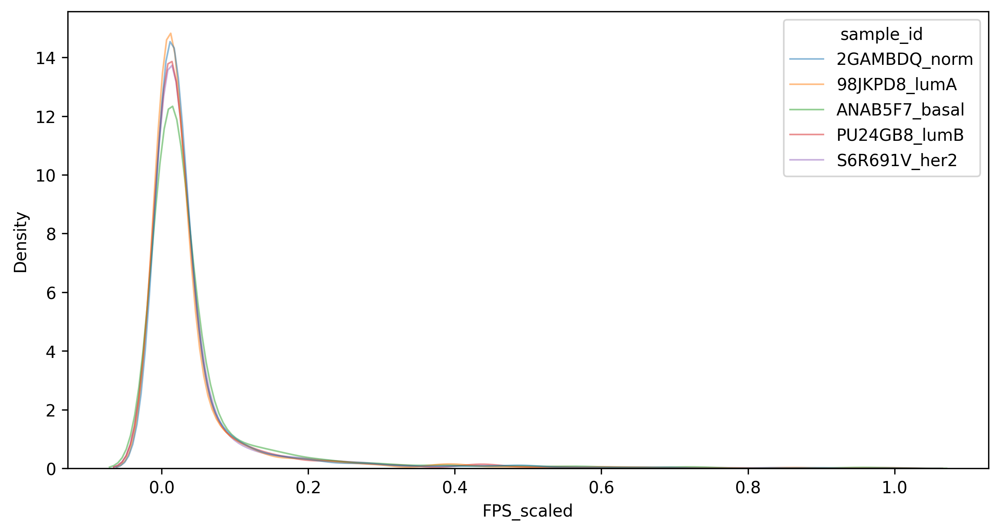

In [9]:
# plot fps distribution
plt.figure(figsize=(10, 5), dpi=300)
sns.kdeplot(data=fps_df_scaled_lpv, x="FPS_scaled", hue="sample_id", fill=False, common_norm=False, alpha=.5, linewidth=1)
plt.show()

### Merging `afps_df_lpv` and `fps_df_scaled_lpv`

Now we can merge the two long dataframes together to get both raw FPS and scaled FPS values in one dataframe.

In [10]:
afps_df_lpv

,region_id,sample_id,AF,FPS
0,chr1:905473-905483,2GAMBDQ_norm,0.000000,0.14062
1,chr1:905473-905483,98JKPD8_lumA,0.000000,0.10260
2,chr1:905473-905483,ANAB5F7_basal,0.000000,0.12218
3,chr1:905473-905483,PU24GB8_lumB,0.027778,0.12024
4,chr1:905473-905483,S6R691V_her2,0.000000,0.13921
...,...,...,...,...
10920,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522
10921,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392
10922,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363
10923,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735


In [11]:
fps_df_scaled_lpv

,region_id,sample_id,FPS_scaled
0,chr1:905473-905483,2GAMBDQ_norm,0.065892
1,chr1:905473-905483,98JKPD8_lumA,0.045183
2,chr1:905473-905483,ANAB5F7_basal,0.062660
3,chr1:905473-905483,PU24GB8_lumB,0.056307
4,chr1:905473-905483,S6R691V_her2,0.069304
...,...,...,...
10920,chrX:150849074-150849084,2GAMBDQ_norm,0.096162
10921,chrX:150849074-150849084,98JKPD8_lumA,0.151456
10922,chrX:150849074-150849084,ANAB5F7_basal,0.037761
10923,chrX:150849074-150849084,PU24GB8_lumB,0.115831


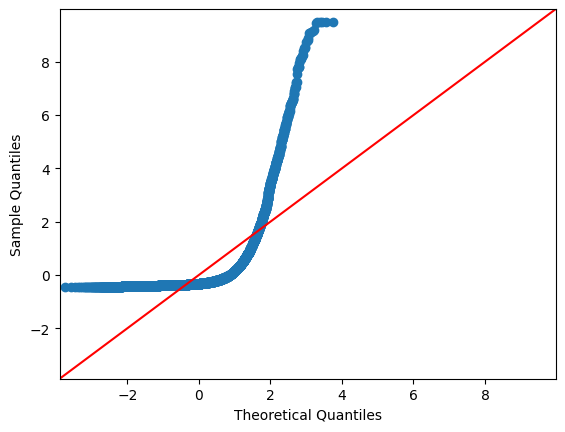

In [12]:
fig = sm.qqplot(fps_df_scaled_lpv['FPS_scaled'], line='45', fit=True)
plt.show()

In [13]:
# merge two dataframes on region_id and sample_id
afps_full_dfl = afps_df_lpv.merge(fps_df_scaled_lpv, on=['region_id', 'sample_id'])
afps_full_dfl

,region_id,sample_id,AF,FPS,FPS_scaled
0,chr1:905473-905483,2GAMBDQ_norm,0.000000,0.14062,0.065892
1,chr1:905473-905483,98JKPD8_lumA,0.000000,0.10260,0.045183
2,chr1:905473-905483,ANAB5F7_basal,0.000000,0.12218,0.062660
3,chr1:905473-905483,PU24GB8_lumB,0.027778,0.12024,0.056307
4,chr1:905473-905483,S6R691V_her2,0.000000,0.13921,0.069304
...,...,...,...,...,...
10920,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162
10921,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456
10922,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761
10923,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735,0.115831


In [14]:
# save to file
# afps_full_dfl.to_csv(f'/home/msazizan/hyperspace/gatk-workflow/plotting/output-data/AF-FPS_regionsorted_full_longtable/{motif_id}_afps_full_scaled_longtable.tsv', sep='\t', index=False)

In [15]:
dutchfield = ["#e60049", "#0bb4ff", "#87bc45", "#ef9b20", "#b33dc6"]

springpastel = ["#fd7f6f", "#7eb0d5", "#b2e061", "#bd7ebe", "#ffb55a"] 

### Calculating Variation Statistics
With the full data table cleaned up into a long format, we can now calculate the variation statistics for each region. We will calculate the following statistics:
* variance (Var)
* ~~coefficient of variation (CV)~~
* ~~quartile coefficient of dispersion (QCD)~~

First calculate statistics on the raw FPS data.

In [16]:
# extract fps columns
fps_df = matrix_afps.filter(regex='_fps$|_id$')
# calculate variance of fps values across samples per region_id and add to a new column called 'fps_var'
fps_df = fps_df.set_index('region_id')
fps_df['FPS_var'] = fps_df.var(axis=1)
# calculate the coefficient of variation (CV) of fps values across samples per region_id and add to a new column called 'fps_cv'
# fps_df['FPS_cv'] = fps_df.drop(columns=['FPS_var']).std(axis=1) / fps_df.drop(columns=['FPS_var']).mean(axis=1) * 100
# calculate the quartile coefficient of dispersion (QCD) of fps values across samples per region_id and add to a new column called 'fps_qcd'
# fps_df['FPS_qcd'] = (fps_df.drop(columns=['FPS_var', 'FPS_cv']).quantile(q=0.75, axis=1) - fps_df.drop(columns=['FPS_var', 'FPS_cv']).quantile(q=0.25, axis=1)) / (fps_df.drop(columns=['FPS_var', 'FPS_cv']).quantile(q=0.75, axis=1) + fps_df.drop(columns=['FPS_var', 'FPS_cv']).quantile(q=0.25, axis=1))
fps_df

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,FPS_var
region_id,,,,,,
chr1:905473-905483,0.10260,0.12218,0.13921,0.12024,0.14062,0.000245
chr1:925405-925415,0.09540,0.03670,0.09011,0.05082,0.05586,0.000659
chr1:1020750-1020760,0.09749,0.09080,0.07864,0.10880,0.08458,0.000137
chr1:1130413-1130423,0.11471,0.04786,0.11338,0.14384,0.15151,0.001668
chr1:1225277-1225287,0.01792,0.04624,0.02729,0.01957,0.02657,0.000127
...,...,...,...,...,...,...
chrX:118300271-118300281,0.00703,0.00985,0.00556,0.00611,0.00910,0.000003
chrX:119211181-119211191,0.01215,0.01187,0.01025,0.01366,0.01454,0.000003
chrX:139342109-139342119,0.02016,0.00831,0.02155,0.01655,0.02160,0.000031


Then do the same on the fps scaled data.

In [17]:
# calculate variance of fps_scaled values across samples per region_id and add to a new column called 'fps_scaled_var'
fps_df_scaled['FPS_scaled_var'] = fps_df_scaled.var(axis=1)
# calculate the coefficient of variation (CV) of fps values across samples per region_id and add to a new column called 'fps_scaled_cv'
# fps_df_scaled['FPS_scaled_cv'] = fps_df_scaled.drop(columns=['FPS_scaled_var']).std(axis=1) / fps_df_scaled.drop(columns=['FPS_scaled_var']).mean(axis=1) * 100
# calculate the quartile coefficient of dispersion (QCD) of fps values across samples per region_id and add to a new column called 'fps_scaled_qcd'
# fps_df_scaled['FPS_scaled_qcd'] = (fps_df_scaled.drop(columns=['FPS_scaled_var', 'FPS_scaled_cv']).quantile(q=0.75, axis=1) - fps_df_scaled.drop(columns=['FPS_scaled_var', 'FPS_scaled_cv']).quantile(q=0.25, axis=1)) / (fps_df_scaled.drop(columns=['FPS_scaled_var', 'FPS_scaled_cv']).quantile(q=0.75, axis=1) + fps_df_scaled.drop(columns=['FPS_scaled_var', 'FPS_scaled_cv']).quantile(q=0.25, axis=1))
fps_df_scaled

,98JKPD8_lumA_fps_scaled,ANAB5F7_basal_fps_scaled,S6R691V_her2_fps_scaled,PU24GB8_lumB_fps_scaled,2GAMBDQ_norm_fps_scaled,FPS_scaled_var
region_id,,,,,,
chr1:905473-905483,0.045183,0.062660,0.069304,0.056307,0.065892,9.036129e-05
chr1:925405-925415,0.042012,0.018821,0.044860,0.023798,0.026175,1.341879e-04
chr1:1020750-1020760,0.042933,0.046566,0.039150,0.050950,0.039632,2.462661e-05
chr1:1130413-1130423,0.050516,0.024545,0.056445,0.067359,0.070994,3.382467e-04
chr1:1225277-1225287,0.007892,0.023714,0.013586,0.009164,0.012450,3.889771e-05
...,...,...,...,...,...,...
chrX:118300271-118300281,0.003096,0.005052,0.002768,0.002861,0.004264,1.009942e-06
chrX:119211181-119211191,0.005351,0.006087,0.005103,0.006397,0.006813,5.101216e-07
chrX:139342109-139342119,0.008878,0.004262,0.010728,0.007750,0.010121,6.536719e-06


Now merge the two statistics tables together on `region_id` index.

In [18]:
# subset only the fps stats columns
# fps_stats_df = fps_df.filter(regex='_var$|_cv$|_qcd$|_id$').copy()
# fps_scaled_stats_df = fps_df_scaled.filter(regex='_var$|_cv$|_qcd$|_id$').copy()
fps_stats_df = fps_df.filter(regex='_var$|_id$').copy()
fps_scaled_stats_df = fps_df_scaled.filter(regex='_var$|_id$').copy()
# merge on region_id index from both tables
fps_stats_all_df = fps_stats_df.merge(fps_scaled_stats_df, left_index=True, right_index=True)
fps_stats_all_df

,FPS_var,FPS_scaled_var
region_id,,
chr1:905473-905483,0.000245,9.036129e-05
chr1:925405-925415,0.000659,1.341879e-04
chr1:1020750-1020760,0.000137,2.462661e-05
chr1:1130413-1130423,0.001668,3.382467e-04
chr1:1225277-1225287,0.000127,3.889771e-05
...,...,...
chrX:118300271-118300281,0.000003,1.009942e-06
chrX:119211181-119211191,0.000003,5.101216e-07
chrX:139342109-139342119,0.000031,6.536719e-06


Now we have two different sets of stats data to merge with the long form AF_FPS table.

In [19]:
# set the index to 'region_id'
afps_full_dfl_ind = afps_full_dfl.set_index('region_id')
afps_full_dfl_ind

,sample_id,AF,FPS,FPS_scaled
region_id,,,,
chr1:905473-905483,2GAMBDQ_norm,0.000000,0.14062,0.065892
chr1:905473-905483,98JKPD8_lumA,0.000000,0.10260,0.045183
chr1:905473-905483,ANAB5F7_basal,0.000000,0.12218,0.062660
chr1:905473-905483,PU24GB8_lumB,0.027778,0.12024,0.056307
chr1:905473-905483,S6R691V_her2,0.000000,0.13921,0.069304
...,...,...,...,...
chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162
chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456
chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761


In [20]:
# merge afps_full_dfl_ind with stats df on region_id
fps_merged_stats = afps_full_dfl_ind.merge(fps_stats_all_df, left_index=True, right_index=True, how='left')

# sort naturally by region_id
fps_merged_stats_sorted =fps_merged_stats.reset_index().reindex(index=index_natsorted(fps_merged_stats.index))
fps_merged_stats_sorted

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var
5145,chr1:905473-905483,2GAMBDQ_norm,0.000000,0.14062,0.065892,0.000245,0.000090
5146,chr1:905473-905483,98JKPD8_lumA,0.000000,0.10260,0.045183,0.000245,0.000090
5147,chr1:905473-905483,ANAB5F7_basal,0.000000,0.12218,0.062660,0.000245,0.000090
5148,chr1:905473-905483,PU24GB8_lumB,0.027778,0.12024,0.056307,0.000245,0.000090
5149,chr1:905473-905483,S6R691V_her2,0.000000,0.13921,0.069304,0.000245,0.000090
...,...,...,...,...,...,...,...
10780,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162,0.013487,0.002941
10781,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456,0.013487,0.002941
10782,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761,0.013487,0.002941
10783,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735,0.115831,0.013487,0.002941


In [21]:
# save file 
# fps_merged_stats_sorted.to_csv(f'/home/msazizan/hyperspace/gatk-workflow/plotting/output-data/AF-FPS_regionsorted_full_longtable/{motif_id}_afps_full_scaled_longtable_with_stats.tsv', sep='\t', index=False)

### Filtering Variant Sites (FPS)
From here on, it makes sense to filter out variant sites that has `FPS` value `== 0`, or `FPS_cv` or `FPS_qcd` values `== NaN`. This means that the raw FPS values across subtypes are zero, i.e. there is no evidence of footprinting at all at these sites despite a TFBS matching a motif being present (assigned by TOBIAS), leading to an undefined CV and QCD value.

In [22]:
# filter out unique region_id rows that have fps == 0
# group by 'region_id' first 
merged_filt = fps_merged_stats_sorted.groupby('region_id').filter(lambda x: x['FPS'].sum() > 0)
merged_filt

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var
5145,chr1:905473-905483,2GAMBDQ_norm,0.000000,0.14062,0.065892,0.000245,0.000090
5146,chr1:905473-905483,98JKPD8_lumA,0.000000,0.10260,0.045183,0.000245,0.000090
5147,chr1:905473-905483,ANAB5F7_basal,0.000000,0.12218,0.062660,0.000245,0.000090
5148,chr1:905473-905483,PU24GB8_lumB,0.027778,0.12024,0.056307,0.000245,0.000090
5149,chr1:905473-905483,S6R691V_her2,0.000000,0.13921,0.069304,0.000245,0.000090
...,...,...,...,...,...,...,...
10780,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162,0.013487,0.002941
10781,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456,0.013487,0.002941
10782,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761,0.013487,0.002941
10783,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735,0.115831,0.013487,0.002941


In [23]:
# merged_filt[(merged_filt['FPS_cv'].isna() | merged_filt['FPS_qcd'].isna())]

We are not interested in footprints that carry no called variants so we can also filter out all rows with `AF == 0`, as these represent sites that are not variant at all. The only reason they are in the matrix is because during the raw data merging, these sites are retained when there is at least one subtype that has a non-zero AF value at that site, or non-zero FPS values at that site.

However, we would still be interested in sites with AF values not equal zero at least in one of the subtypes, so we do not want to filter out sites that have at least one non-zero AF value.

In [24]:
# filter out unique region_id rows that have AF == 0 in all subtypes (sample_id grouping)
# this has to be per group, so we need to groupby first
merged_filt = merged_filt.groupby('region_id').filter(lambda x: (x['AF'] != 0).any())
merged_filt

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var
5145,chr1:905473-905483,2GAMBDQ_norm,0.000000,0.14062,0.065892,0.000245,0.000090
5146,chr1:905473-905483,98JKPD8_lumA,0.000000,0.10260,0.045183,0.000245,0.000090
5147,chr1:905473-905483,ANAB5F7_basal,0.000000,0.12218,0.062660,0.000245,0.000090
5148,chr1:905473-905483,PU24GB8_lumB,0.027778,0.12024,0.056307,0.000245,0.000090
5149,chr1:905473-905483,S6R691V_her2,0.000000,0.13921,0.069304,0.000245,0.000090
...,...,...,...,...,...,...,...
10780,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162,0.013487,0.002941
10781,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456,0.013487,0.002941
10782,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761,0.013487,0.002941
10783,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735,0.115831,0.013487,0.002941


Now we can select unique `region_id`s that have at least one AF value in the subtype group that is equal to 0 AND the max AF value in the subtype group is more than 0.5. This is because for sites that have a called variant in at least one subtype, we are only interested in them if the called variant has AF of more than 0.5.

We first group the df by the unique values of column `region_id`, then we retain only regions whose max value of column `AF` per unique site is more than 0.5.

In [25]:
# for each unique region_id, find those that has AF == 0 in at least one subtype
# this has to be per group, so we need to groupby first
region_af_zero = merged_filt.groupby('region_id').filter(lambda x: (x['AF'] == 0).any())

# then find the max AF value for each region_id and add to a new column called 'max_AF'
df = region_af_zero.groupby('region_id').agg({'AF': 'max'}).rename(columns={'AF': 'max_AF'}).reset_index()
max_af = df.reindex(index=index_natsorted(df['region_id']))
max_af

,region_id,max_AF
640,chr1:905473-905483,0.027778
526,chr1:1020750-1020760,0.062500
617,chr1:3432506-3432516,0.166667
625,chr1:3948502-3948512,0.181818
629,chr1:5274704-5274714,0.250000
...,...,...
1365,chrX:115338019-115338029,0.029412
1366,chrX:118300271-118300281,0.071429
1367,chrX:119211181-119211191,0.093750
1368,chrX:139342109-139342119,0.066667


In [26]:
# now return a boolean mask for regions that have max_AF <= 0.5
mask = max_af['max_AF'] <= 0.5
mask.sum()

1379

Now we can filter the merged dataframes such that rows that have `region_id` in the Boolean-masked `max_af` dataframe will be discarded.

In [27]:
# this is done by subsetting the long dataframe with an expression that makes use of isin() method on the max_af dataframe masked by the boolean series, and then taking the inverse of the expression using ~
merged_filt = merged_filt[~(merged_filt['region_id'].isin(max_af[mask]['region_id']))]
merged_filt

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var
5160,chr1:925405-925415,2GAMBDQ_norm,1.000000,0.05586,0.026175,0.000659,0.000134
5161,chr1:925405-925415,98JKPD8_lumA,1.000000,0.09540,0.042012,0.000659,0.000134
5162,chr1:925405-925415,ANAB5F7_basal,0.730769,0.03670,0.018821,0.000659,0.000134
5163,chr1:925405-925415,PU24GB8_lumB,0.769231,0.05082,0.023798,0.000659,0.000134
5164,chr1:925405-925415,S6R691V_her2,0.730769,0.09011,0.044860,0.000659,0.000134
...,...,...,...,...,...,...,...
10780,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162,0.013487,0.002941
10781,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456,0.013487,0.002941
10782,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761,0.013487,0.002941
10783,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735,0.115831,0.013487,0.002941


### Filtering Variant Sites (AF)
Now we can calculate the median for AF values to append to the merged, filtered longform dataframe.

In [28]:
# copy the filtered dataframe
mf_df = merged_filt.copy()
mf_df = mf_df.reset_index(drop=True)
# calculate AF median per region_id
mf_df['AF_median'] = mf_df.groupby('region_id')['AF'].transform('median')

In [29]:
mf_df

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_median
0,chr1:925405-925415,2GAMBDQ_norm,1.000000,0.05586,0.026175,0.000659,0.000134,0.769231
1,chr1:925405-925415,98JKPD8_lumA,1.000000,0.09540,0.042012,0.000659,0.000134,0.769231
2,chr1:925405-925415,ANAB5F7_basal,0.730769,0.03670,0.018821,0.000659,0.000134,0.769231
3,chr1:925405-925415,PU24GB8_lumB,0.769231,0.05082,0.023798,0.000659,0.000134,0.769231
4,chr1:925405-925415,S6R691V_her2,0.730769,0.09011,0.044860,0.000659,0.000134,0.769231
...,...,...,...,...,...,...,...,...
3285,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162,0.013487,0.002941,0.600000
3286,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456,0.013487,0.002941,0.600000
3287,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761,0.013487,0.002941,0.600000
3288,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735,0.115831,0.013487,0.002941,0.600000


In [30]:
mf_df.groupby('region_id')['AF'].transform('var')

0       0.019970
1       0.019970
2       0.019970
3       0.019970
4       0.019970
          ...   
3285    0.008072
3286    0.008072
3287    0.008072
3288    0.008072
3289    0.008072
Name: AF, Length: 3290, dtype: float64

In [31]:
# calculate the variance of AF per region_id and add to a new column called 'AF_var'
mf_df['AF_var'] = mf_df.groupby('region_id')['AF'].transform('var')
# mf_df['AF_cv'] = mf_df.groupby('region_id')['AF'].transform(lambda x: x.std() / x.mean() * 100)

# set a small constant for QCD calculation to prevent NaN due to division by zero
# constant = 0.0001
# mf_df['AF_qcd'] = mf_df.groupby('region_id')['AF'].transform(lambda x: (x.quantile(q=0.75) - x.quantile(q=0.25)) / (x.quantile(q=0.75) + x.quantile(q=0.25) + constant))
mf_df

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_median,AF_var
0,chr1:925405-925415,2GAMBDQ_norm,1.000000,0.05586,0.026175,0.000659,0.000134,0.769231,0.019970
1,chr1:925405-925415,98JKPD8_lumA,1.000000,0.09540,0.042012,0.000659,0.000134,0.769231,0.019970
2,chr1:925405-925415,ANAB5F7_basal,0.730769,0.03670,0.018821,0.000659,0.000134,0.769231,0.019970
3,chr1:925405-925415,PU24GB8_lumB,0.769231,0.05082,0.023798,0.000659,0.000134,0.769231,0.019970
4,chr1:925405-925415,S6R691V_her2,0.730769,0.09011,0.044860,0.000659,0.000134,0.769231,0.019970
...,...,...,...,...,...,...,...,...,...
3285,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162,0.013487,0.002941,0.600000,0.008072
3286,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456,0.013487,0.002941,0.600000,0.008072
3287,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761,0.013487,0.002941,0.600000,0.008072
3288,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735,0.115831,0.013487,0.002941,0.600000,0.008072


Let's visualize the AF distribution for each variant site.

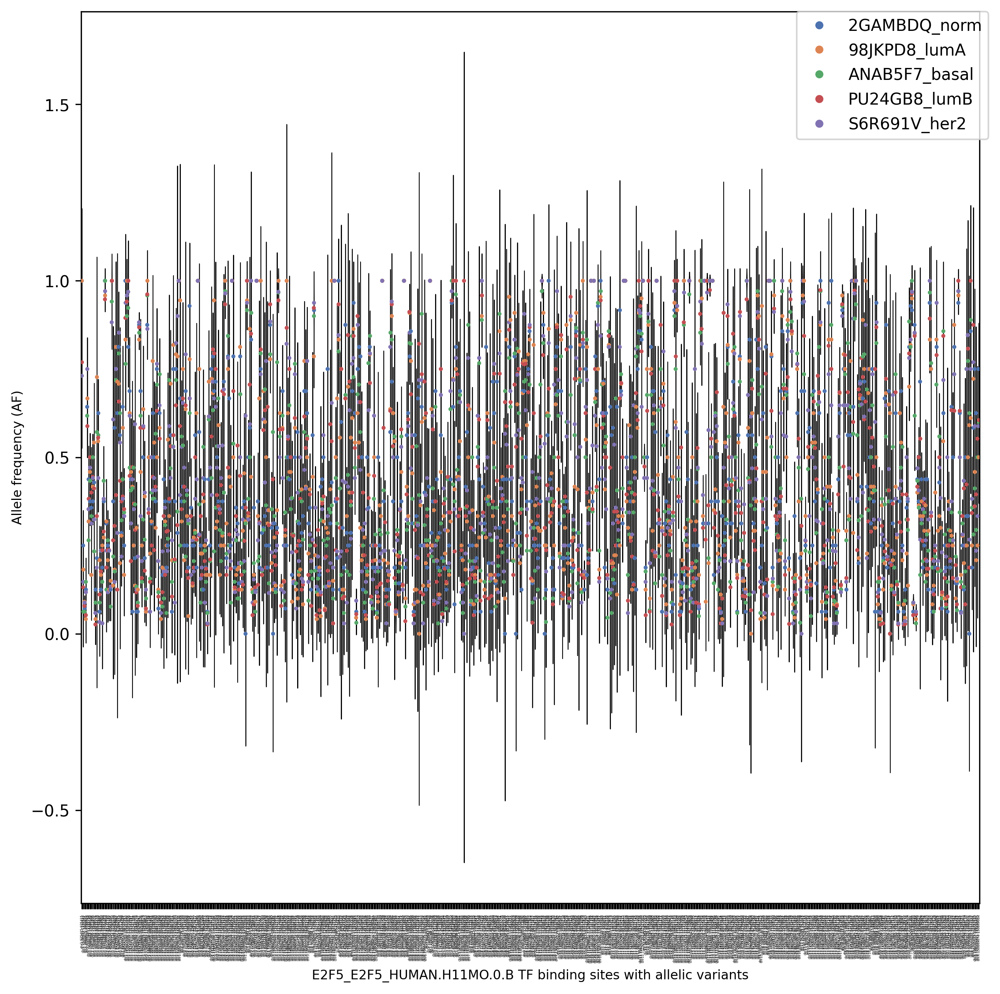

In [32]:
# plot violin plot for AF on the filtered dataframe
plt.figure(figsize=(10, 10), dpi=300)
sns.violinplot(x='region_id', y='AF', data=mf_df, color='lightgray', inner='quartile', linecolor='black', linewidth=0.5)
plt.xticks(rotation=90, fontsize=2)
sns.stripplot(x='region_id', y='AF', data=mf_df, hue='sample_id', size=2.5, jitter=True, palette='deep')


# plot legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants', fontsize=8)
plt.ylabel('Allele frequency (AF)', fontsize=8)
plt.show()

Plotting the whole data makes the plot look very busy. We can split the data into 2 groups: 'high AF' and 'low AF'. We will define 'high AF' as `AF_median` > 0.5, and 'low AF' as `AF_median` <= 0.5. 

In [33]:
# to ensure that each unique region_id is retained as a group of subtype rows, we need to filter after grouping per region_id
high_af = mf_df.groupby('region_id').filter(lambda x: (x['AF_median'] > 0.5).any())
high_af

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_median,AF_var
0,chr1:925405-925415,2GAMBDQ_norm,1.000000,0.05586,0.026175,0.000659,0.000134,0.769231,0.019970
1,chr1:925405-925415,98JKPD8_lumA,1.000000,0.09540,0.042012,0.000659,0.000134,0.769231,0.019970
2,chr1:925405-925415,ANAB5F7_basal,0.730769,0.03670,0.018821,0.000659,0.000134,0.769231,0.019970
3,chr1:925405-925415,PU24GB8_lumB,0.769231,0.05082,0.023798,0.000659,0.000134,0.769231,0.019970
4,chr1:925405-925415,S6R691V_her2,0.730769,0.09011,0.044860,0.000659,0.000134,0.769231,0.019970
...,...,...,...,...,...,...,...,...,...
3285,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162,0.013487,0.002941,0.600000,0.008072
3286,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456,0.013487,0.002941,0.600000,0.008072
3287,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761,0.013487,0.002941,0.600000,0.008072
3288,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735,0.115831,0.013487,0.002941,0.600000,0.008072


In [34]:
low_af = mf_df.groupby('region_id').filter(lambda x: (x['AF_median'] <= 0.5).any())
low_af

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_median,AF_var
5,chr1:1130413-1130423,2GAMBDQ_norm,0.250000,0.15151,0.070994,0.001668,0.000338,0.147059,0.004728
6,chr1:1130413-1130423,98JKPD8_lumA,0.181818,0.11471,0.050516,0.001668,0.000338,0.147059,0.004728
7,chr1:1130413-1130423,ANAB5F7_basal,0.062500,0.04786,0.024545,0.001668,0.000338,0.147059,0.004728
8,chr1:1130413-1130423,PU24GB8_lumB,0.131579,0.14384,0.067359,0.001668,0.000338,0.147059,0.004728
9,chr1:1130413-1130423,S6R691V_her2,0.147059,0.11338,0.056445,0.001668,0.000338,0.147059,0.004728
...,...,...,...,...,...,...,...,...,...
3280,chrX:116240865-116240875,2GAMBDQ_norm,0.250000,0.03826,0.017928,0.000113,0.000034,0.333333,0.020035
3281,chrX:116240865-116240875,98JKPD8_lumA,0.250000,0.02826,0.012445,0.000113,0.000034,0.333333,0.020035
3282,chrX:116240865-116240875,ANAB5F7_basal,0.500000,0.04863,0.024940,0.000113,0.000034,0.333333,0.020035
3283,chrX:116240865-116240875,PU24GB8_lumB,0.552632,0.02045,0.009577,0.000113,0.000034,0.333333,0.020035


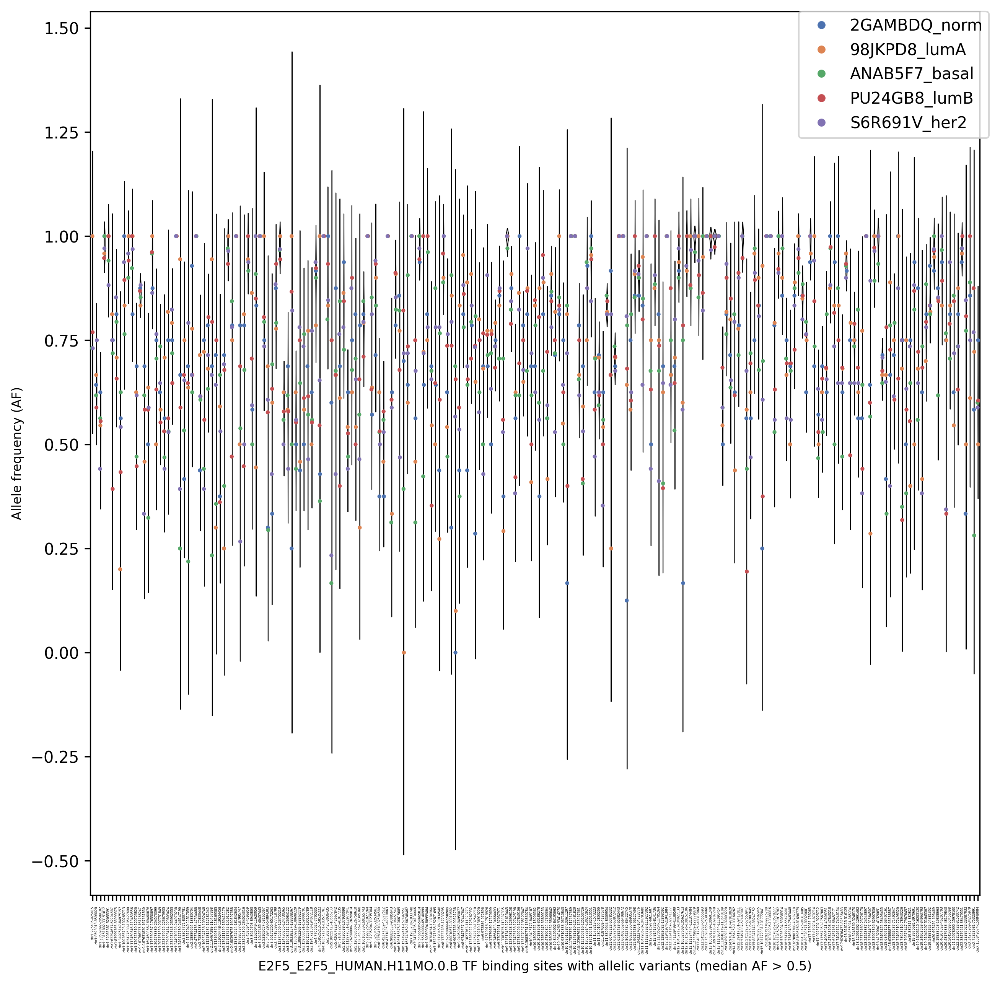

In [35]:
# plot violin plot for high AF set
plt.figure(figsize=(10, 10), dpi=300)
sns.violinplot(x='region_id', y='AF', data=high_af, color='lightgray', inner='quartile', linecolor='black', linewidth=0.5)
plt.xticks(rotation=90, fontsize=2)
sns.stripplot(x='region_id', y='AF', data=high_af, hue='sample_id', size=2.5, jitter=True, palette='deep')


# plot legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (median AF > 0.5)', fontsize=8)
plt.ylabel('Allele frequency (AF)', fontsize=8)
plt.show()

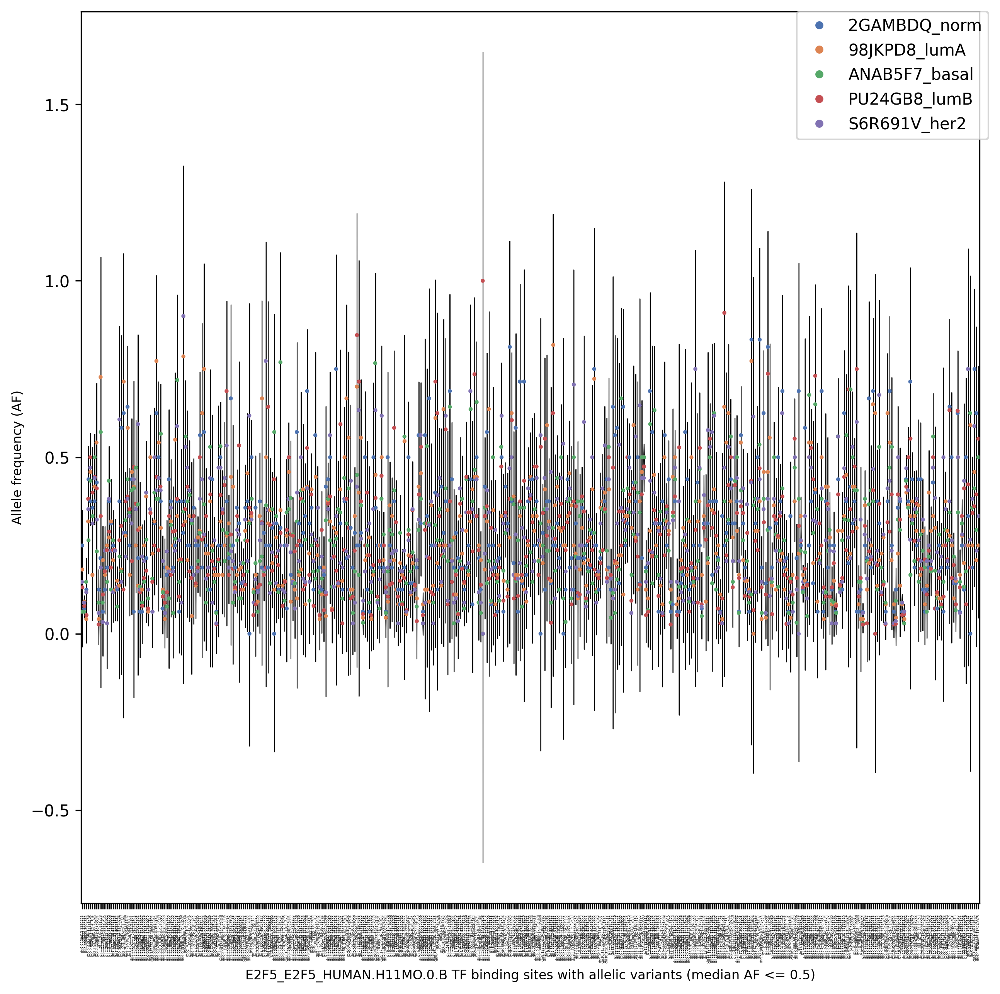

In [36]:
# plot violin plot for low AF set
plt.figure(figsize=(10, 10), dpi=300)
sns.violinplot(x='region_id', y='AF', data=low_af, color='lightgray', inner='quartile', linecolor='black', linewidth=0.5)
plt.xticks(rotation=90, fontsize=2)
sns.stripplot(x='region_id', y='AF', data=low_af, hue='sample_id', size=2.5, jitter=True, palette='deep')


# plot legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (median AF <= 0.5)', fontsize=8)
plt.ylabel('Allele frequency (AF)', fontsize=8)
plt.show()

There are definitely sites that have individual subtype with AF == 0 retained, which means that there are sites with high variance. We can filter and plot only these regions to see which subtype it is.

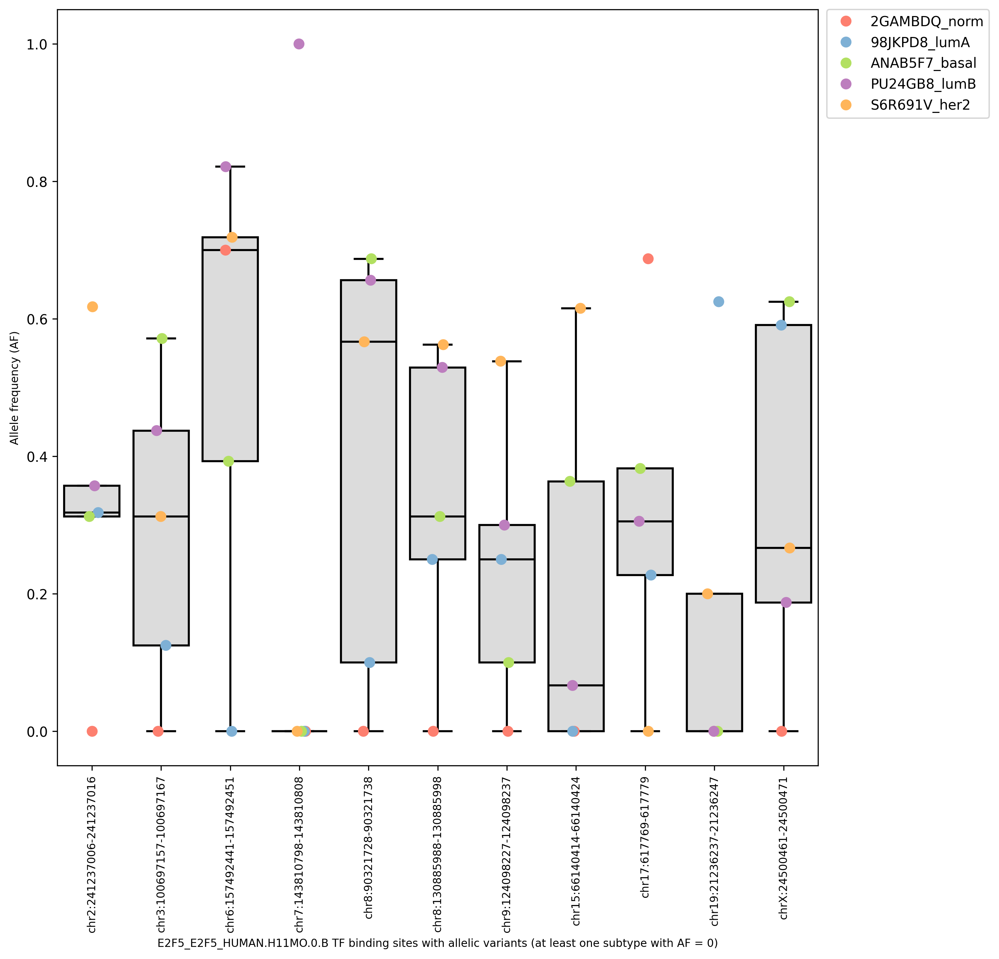

In [37]:
# plot violin plot for sites with at least one subtype with AF == 0
plt.figure(figsize=(10, 10), dpi=300)
sns.boxplot(x='region_id', y='AF', data=mf_df.groupby('region_id').filter(lambda x: (x['AF'] == 0).any()), color='gainsboro', linecolor='black', linewidth=1.5, showfliers=False)
plt.xticks(rotation=90, fontsize=8)
sns.stripplot(x='region_id', y='AF', data=mf_df.groupby('region_id').filter(lambda x: (x['AF'] == 0).any()), hue='sample_id', size=8, jitter=True, palette=springpastel)


# plot legend outside of the plot
plt.legend(bbox_to_anchor=(1.225, 1),borderaxespad=0, markerscale=1, fontsize=10)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (at least one subtype with AF = 0)', fontsize=8)
plt.ylabel('Allele frequency (AF)', fontsize=8)

plt.show()

No clear pattern of enrichment of a specific subtype with high AF compared to the rest can be seen. We can use the subset of these to plot the distribution of the associated FPS values (unscaled). 

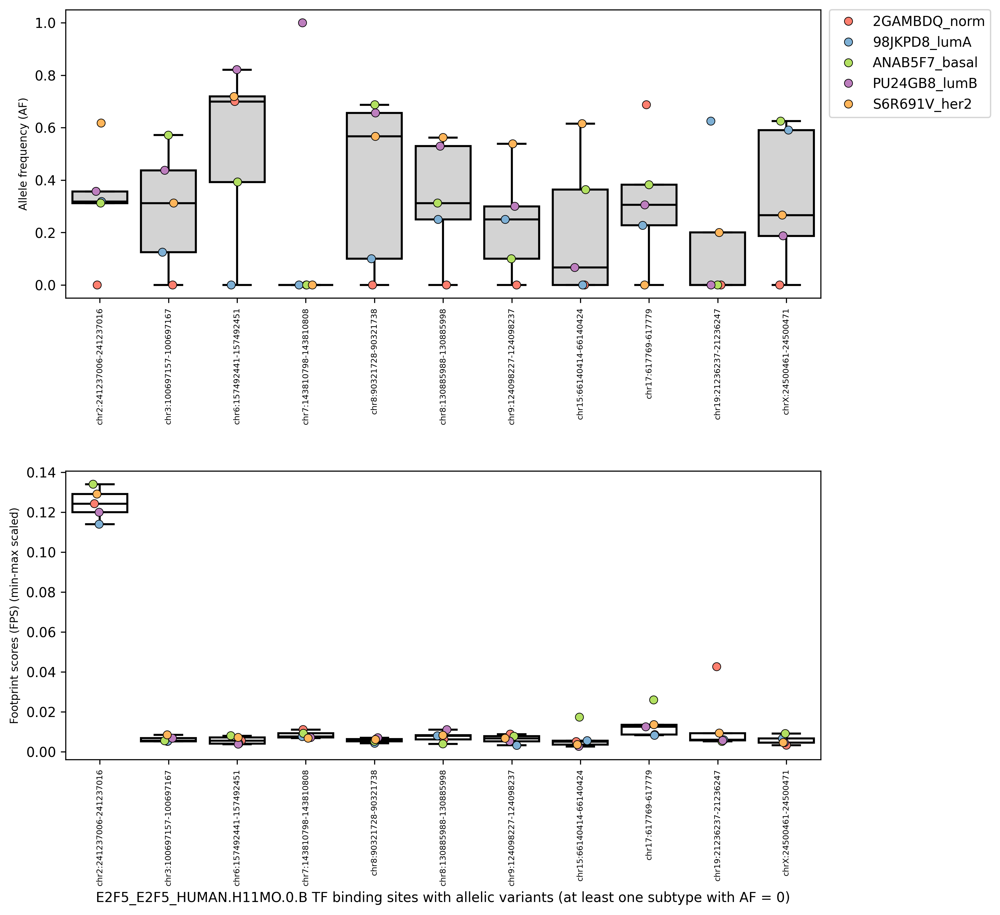

In [38]:
plt.figure(figsize=(10, 10), dpi=300)
plt.subplot(2, 1, 1)
sns.boxplot(x='region_id', y='AF', data=mf_df.groupby('region_id').filter(lambda x: (x['AF'] == 0).any()), color='lightgray', linecolor='black', linewidth=1.5, showfliers=False)
plt.xticks(rotation=90, fontsize=6)
sns.stripplot(x='region_id', y='AF', data=mf_df.groupby('region_id').filter(lambda x: (x['AF'] == 0).any()), hue='sample_id', size=6, jitter=True, palette=springpastel, linewidth=0.5, edgecolor='black')
# plot legend outside of the plot
plt.legend(bbox_to_anchor=(1.225, 1),borderaxespad=0, markerscale=1, fontsize=10)
plt.xlabel('')
plt.ylabel('Allele frequency (AF)', fontsize=8)

# then plot the scaled FPS values for these sites
plt.subplot(2, 1, 2)
sns.boxplot(x='region_id', y='FPS_scaled', data=mf_df.groupby('region_id').filter(lambda x: (x['AF'] == 0).any()), color='white', linecolor='black', linewidth=1.5, showfliers=False)
plt.xticks(rotation=90, fontsize=6)
sns.stripplot(x='region_id', y='FPS_scaled', data=mf_df.groupby('region_id').filter(lambda x: (x['AF'] == 0).any()), hue='sample_id', size=6, jitter=True, palette=springpastel, legend=False, linewidth=0.5, edgecolor='black')
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (at least one subtype with AF = 0)', fontsize=10)
plt.ylabel(f'Footprint scores (FPS) (min-max scaled)', fontsize=8)
plt.subplots_adjust(hspace=0.6)
plt.show()

Some cancer subtypes appear to not have alternative alleles in certain sites but there is barely any pattern of enrichment in FPS values for any specific subtype.

What is the range of FPS variance in the subset dataframe?

In [39]:
high_af[['FPS_scaled_var', 'AF_var']].describe()

,FPS_scaled_var,AF_var
count,1.115000e+03,1115.000000
mean,4.116081e-04,0.016051
std,1.581157e-03,0.020156
min,2.684938e-07,0.000000
25%,4.518037e-06,0.002983
50%,1.968279e-05,0.008853
75%,1.232902e-04,0.020862
max,1.878826e-02,0.112277


In [40]:
# subset high_af for sites with FPS_var > 75th percentile + 1.5 * IQR
iqr = high_af['FPS_scaled_var'].quantile(q=0.75) - high_af['FPS_scaled_var'].quantile(q=0.25)
high_af_fps_outliers = high_af[high_af['FPS_scaled_var'] > high_af['FPS_scaled_var'].quantile(q=0.75) + (1.5 * iqr)]

In [41]:
# and then discard sites if it has AF_var == 0
high_nzaf_outliers = high_af_fps_outliers[high_af_fps_outliers['AF_var'] != 0]
high_nzaf_outliers

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_median,AF_var
110,chr1:52055381-52055391,2GAMBDQ_norm,1.000000,0.17739,0.083121,0.001060,0.000310,1.0,0.002768
111,chr1:52055381-52055391,98JKPD8_lumA,1.000000,0.25634,0.112887,0.001060,0.000310,1.0,0.002768
112,chr1:52055381-52055391,ANAB5F7_basal,0.941176,0.24529,0.125796,0.001060,0.000310,1.0,0.002768
113,chr1:52055381-52055391,PU24GB8_lumB,1.000000,0.21208,0.099315,0.001060,0.000310,1.0,0.002768
114,chr1:52055381-52055391,S6R691V_her2,0.882353,0.24599,0.122464,0.001060,0.000310,1.0,0.002768
...,...,...,...,...,...,...,...,...,...
3285,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162,0.013487,0.002941,0.6,0.008072
3286,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456,0.013487,0.002941,0.6,0.008072
3287,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761,0.013487,0.002941,0.6,0.008072
3288,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735,0.115831,0.013487,0.002941,0.6,0.008072


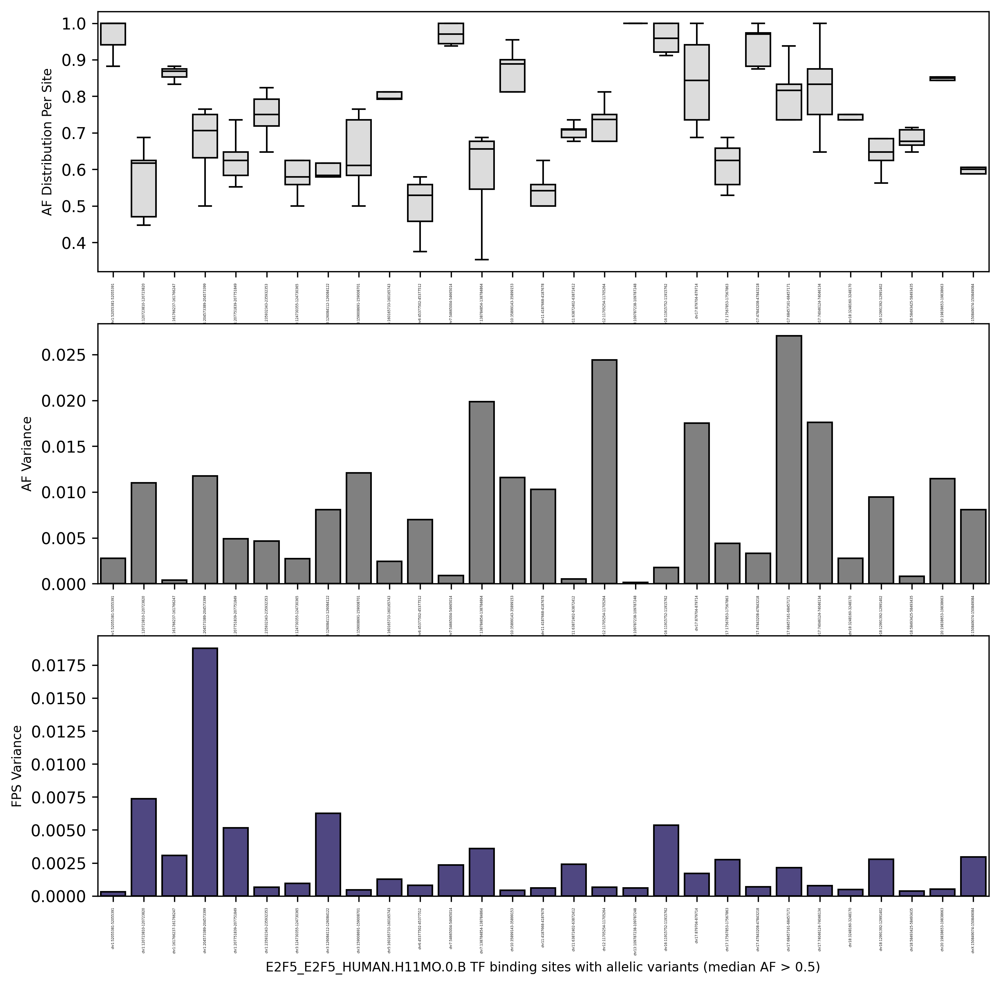

In [42]:
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(3, 1, 1)
sns.boxplot(x='region_id', y='AF', data=high_nzaf_outliers, color='gainsboro', linecolor='black', showfliers=False)
plt.xticks(rotation=90, fontsize=2)
plt.xlabel('')
plt.ylabel('AF Distribution Per Site', fontsize=8)

plt.subplot(3, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=high_nzaf_outliers, color='gray', edgecolor='black')
plt.xticks(rotation=90, fontsize=2)
plt.xlabel('')
plt.ylabel('AF Variance', fontsize=8)

plt.subplot(3, 1, 3)
sns.barplot(x='region_id', y='FPS_scaled_var', data=high_nzaf_outliers, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=2)
# plt.yscale('log')
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (median AF > 0.5)', fontsize=8)
plt.ylabel('FPS Variance', fontsize=8)

plt.show()

In [43]:
high_af_uniq_reg = high_nzaf_outliers[['region_id', 'AF_var', 'FPS_scaled_var']].drop_duplicates()
# sort the region_id in the filtered high_af dataframe based on descending order of AF_var
afvar_uniqsort = high_af_uniq_reg.sort_values(by='AF_var', ascending=False)
# fpsvar_uniqsort = high_af_uniq_reg.sort_values(by='FPS_scaled_var', ascending=False)

Get the `region_id` ordered list based on AF/FPS variance in descending order.

In [44]:
# extract the region_id from the high_af_fps_var_df_uniqsort dataframe
sorted_region_ids = afvar_uniqsort['region_id']

Using the `region_id` array above, we can filter the `high_af` dataframe to only include the `region_id`s in the array.

In [45]:
high_nzaf_outliers

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_median,AF_var
110,chr1:52055381-52055391,2GAMBDQ_norm,1.000000,0.17739,0.083121,0.001060,0.000310,1.0,0.002768
111,chr1:52055381-52055391,98JKPD8_lumA,1.000000,0.25634,0.112887,0.001060,0.000310,1.0,0.002768
112,chr1:52055381-52055391,ANAB5F7_basal,0.941176,0.24529,0.125796,0.001060,0.000310,1.0,0.002768
113,chr1:52055381-52055391,PU24GB8_lumB,1.000000,0.21208,0.099315,0.001060,0.000310,1.0,0.002768
114,chr1:52055381-52055391,S6R691V_her2,0.882353,0.24599,0.122464,0.001060,0.000310,1.0,0.002768
...,...,...,...,...,...,...,...,...,...
3285,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162,0.013487,0.002941,0.6,0.008072
3286,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456,0.013487,0.002941,0.6,0.008072
3287,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761,0.013487,0.002941,0.6,0.008072
3288,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735,0.115831,0.013487,0.002941,0.6,0.008072


In [46]:
# Change 'region_id' to a categorical variable with the categories ordered by 'fps_sorted_region_ids'
df_copy = high_nzaf_outliers.copy()
df_copy['region_id'] = pd.Categorical(high_nzaf_outliers['region_id'], categories=sorted_region_ids, ordered=True)

# Filter the DataFrame
high_nzaf_outlie_filt = df_copy[df_copy['region_id'].isin(sorted_region_ids)]

# Sort the DataFrame by 'region_id'
high_nzaf_outlie_filt = high_nzaf_outlie_filt.sort_values('region_id')
high_nzaf_outlie_filt

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_median,AF_var
2737,chr17:68457161-68457171,ANAB5F7_basal,0.500000,0.30407,0.155941,0.008274,0.002132,0.815789,0.027028
2735,chr17:68457161-68457171,2GAMBDQ_norm,0.937500,0.31338,0.146843,0.008274,0.002132,0.815789,0.027028
2736,chr17:68457161-68457171,98JKPD8_lumA,0.833333,0.40817,0.179750,0.008274,0.002132,0.815789,0.027028
2738,chr17:68457161-68457171,PU24GB8_lumB,0.815789,0.38859,0.181973,0.008274,0.002132,0.815789,0.027028
2739,chr17:68457161-68457171,S6R691V_her2,0.735294,0.52970,0.263706,0.008274,0.002132,0.815789,0.027028
...,...,...,...,...,...,...,...,...,...
2300,chr13:109787238-109787248,2GAMBDQ_norm,1.000000,0.21705,0.101705,0.002501,0.000597,1.000000,0.000139
2301,chr13:109787238-109787248,98JKPD8_lumA,1.000000,0.15718,0.069219,0.002501,0.000597,1.000000,0.000139
2302,chr13:109787238-109787248,ANAB5F7_basal,1.000000,0.20418,0.104713,0.002501,0.000597,1.000000,0.000139
2303,chr13:109787238-109787248,PU24GB8_lumB,0.973684,0.21274,0.099624,0.002501,0.000597,1.000000,0.000139


Next, sort the sample_id values per each unique region_id by a specific order. This order is based on the lexicographic order of the sample_id values in the original matrix.

In [47]:
# get unique sample_id values into a list to define a categorical order
datasets = high_nzaf_outlie_filt['sample_id'].unique().tolist()
datasets = sorted(datasets)

# Create a categorical variable with ordered categories
dataset_copy = high_nzaf_outlie_filt.copy()
dataset_copy['sample_id'] = pd.Categorical(dataset_copy['sample_id'], categories=datasets, ordered=True)

# Sort 'sample_id' within each 'region_id'
high_nzaf_outlie_filtsort = dataset_copy.groupby('region_id', sort=False, observed=False).apply(lambda x: x.sort_values('sample_id')).reset_index(drop=True)

high_nzaf_outlie_filtsort


,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_median,AF_var
0,chr17:68457161-68457171,2GAMBDQ_norm,0.937500,0.31338,0.146843,0.008274,0.002132,0.815789,0.027028
1,chr17:68457161-68457171,98JKPD8_lumA,0.833333,0.40817,0.179750,0.008274,0.002132,0.815789,0.027028
2,chr17:68457161-68457171,ANAB5F7_basal,0.500000,0.30407,0.155941,0.008274,0.002132,0.815789,0.027028
3,chr17:68457161-68457171,PU24GB8_lumB,0.815789,0.38859,0.181973,0.008274,0.002132,0.815789,0.027028
4,chr17:68457161-68457171,S6R691V_her2,0.735294,0.52970,0.263706,0.008274,0.002132,0.815789,0.027028
...,...,...,...,...,...,...,...,...,...
140,chr13:109787238-109787248,2GAMBDQ_norm,1.000000,0.21705,0.101705,0.002501,0.000597,1.000000,0.000139
141,chr13:109787238-109787248,98JKPD8_lumA,1.000000,0.15718,0.069219,0.002501,0.000597,1.000000,0.000139
142,chr13:109787238-109787248,ANAB5F7_basal,1.000000,0.20418,0.104713,0.002501,0.000597,1.000000,0.000139
143,chr13:109787238-109787248,PU24GB8_lumB,0.973684,0.21274,0.099624,0.002501,0.000597,1.000000,0.000139


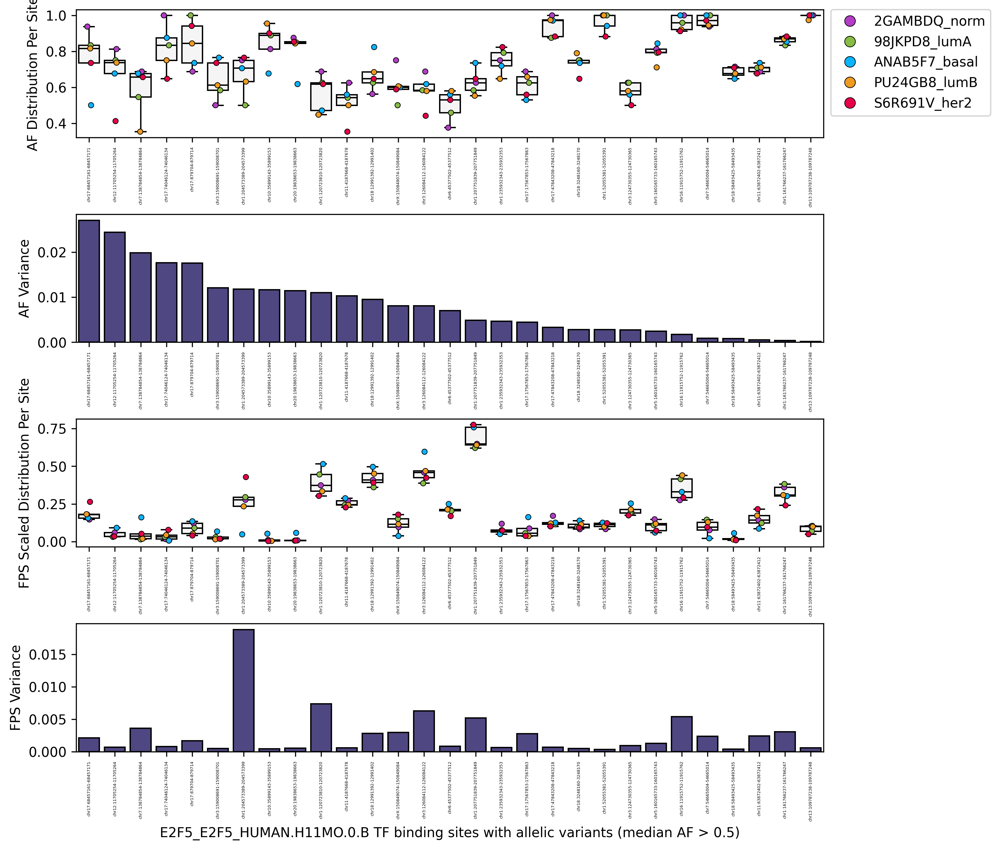

In [48]:
# create color dictionary
dutchfield_colordict = {'S6R691V_her2': "#e60049", 'ANAB5F7_basal': "#0bb4ff", '98JKPD8_lumA': "#87bc45", 'PU24GB8_lumB': "#ef9b20", '2GAMBDQ_norm': "#b33dc6"}
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(4, 1, 1)
sns.boxplot(x='region_id', y='AF', data=high_nzaf_outlie_filtsort, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='AF', data=high_nzaf_outlie_filtsort, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=3)
plt.xlabel('')
plt.ylabel('AF Distribution Per Site', fontsize=10)
# place legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)

plt.subplot(4, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=high_nzaf_outlie_filtsort, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=3)
plt.xlabel('')
plt.ylabel('AF Variance', fontsize=10)
  
plt.subplot(4, 1, 3)
sns.boxplot(x='region_id', y='FPS_scaled', data=high_nzaf_outlie_filtsort, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='FPS_scaled', data=high_nzaf_outlie_filtsort, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=3)
plt.xlabel('')
plt.ylabel('FPS Scaled Distribution Per Site', fontsize=10)

plt.subplot(4, 1, 4)
sns.barplot(x='region_id', y='FPS_scaled_var', data=high_nzaf_outlie_filtsort, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=3)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (median AF > 0.5)', fontsize=10)
plt.ylabel('FPS Variance', fontsize=10)
plt.subplots_adjust(hspace=0.6)
plt.show()

For FPS distribution there are subtypes that are more represented that others. Let's try to selectively highlight subtypes which are the maxima per site. 

In [49]:
# Find the index of the max FPS_scaled value for each region_id
idx_max = high_nzaf_outlie_filtsort.groupby('region_id', observed=True)['FPS_scaled'].idxmax()
idx_min = high_nzaf_outlie_filtsort.groupby('region_id', observed=True)['FPS_scaled'].idxmin()
# Select the corresponding rows
max_fps_scaled = high_nzaf_outlie_filtsort.loc[idx_max]
min_fps_scaled = high_nzaf_outlie_filtsort.loc[idx_min]

# do the same for AF
idx_max_af = high_nzaf_outlie_filtsort.groupby('region_id', observed=True)['AF'].idxmax()
idx_min_af = high_nzaf_outlie_filtsort.groupby('region_id', observed=True)['AF'].idxmin()
# Select the corresponding rows
max_af_raw = high_nzaf_outlie_filtsort.loc[idx_max_af]
min_af_raw = high_nzaf_outlie_filtsort.loc[idx_min_af]

In [50]:
# create masks for the inverse of max and min values
mask = ~high_nzaf_outlie_filtsort.index.isin(idx_max)
max_fps_scaled_inv = high_nzaf_outlie_filtsort[mask]

mask = ~high_nzaf_outlie_filtsort.index.isin(idx_min)
min_fps_scaled_inv = high_nzaf_outlie_filtsort[mask]

# do the same for AF
mask = ~high_nzaf_outlie_filtsort.index.isin(idx_max_af)
max_af_raw_inv = high_nzaf_outlie_filtsort[mask]

mask = ~high_nzaf_outlie_filtsort.index.isin(idx_min_af)
min_af_raw_inv = high_nzaf_outlie_filtsort[mask]

In [51]:
# create color dictionary
color_dict = {'S6R691V_her2': "#e60049", 'ANAB5F7_basal': "#0bb4ff", '98JKPD8_lumA': "#87bc45", 'PU24GB8_lumB': "#ef9b20", '2GAMBDQ_norm': "#b33dc6"}
gray = 'lightgray'
color_gray_dict = {'S6R691V_her2': gray, 'ANAB5F7_basal': gray, '98JKPD8_lumA': gray, 'PU24GB8_lumB': gray, '2GAMBDQ_norm': gray}
# color_dict = {'S6R691V_her2': 'orange', 'ANAB5F7_basal': 'lightseagreen', '98JKPD8_lumA': 'forestgreen', 'PU24GB8_lumB': 'dodgerblue', '2GAMBDQ_norm': 'darkviolet'}
# max_fps_scaled['color'] = max_fps_scaled['sample_id'].map(color_dict)
# min_fps_scaled['color'] = min_fps_scaled['sample_id'].map(color_dict)
# max_af_raw['color'] = max_af_raw['sample_id'].map(color_dict)
# min_af_raw['color'] = min_af_raw['sample_id'].map(color_dict)

In [52]:
color_gray_dict

{'S6R691V_her2': 'lightgray',
 'ANAB5F7_basal': 'lightgray',
 '98JKPD8_lumA': 'lightgray',
 'PU24GB8_lumB': 'lightgray',
 '2GAMBDQ_norm': 'lightgray'}

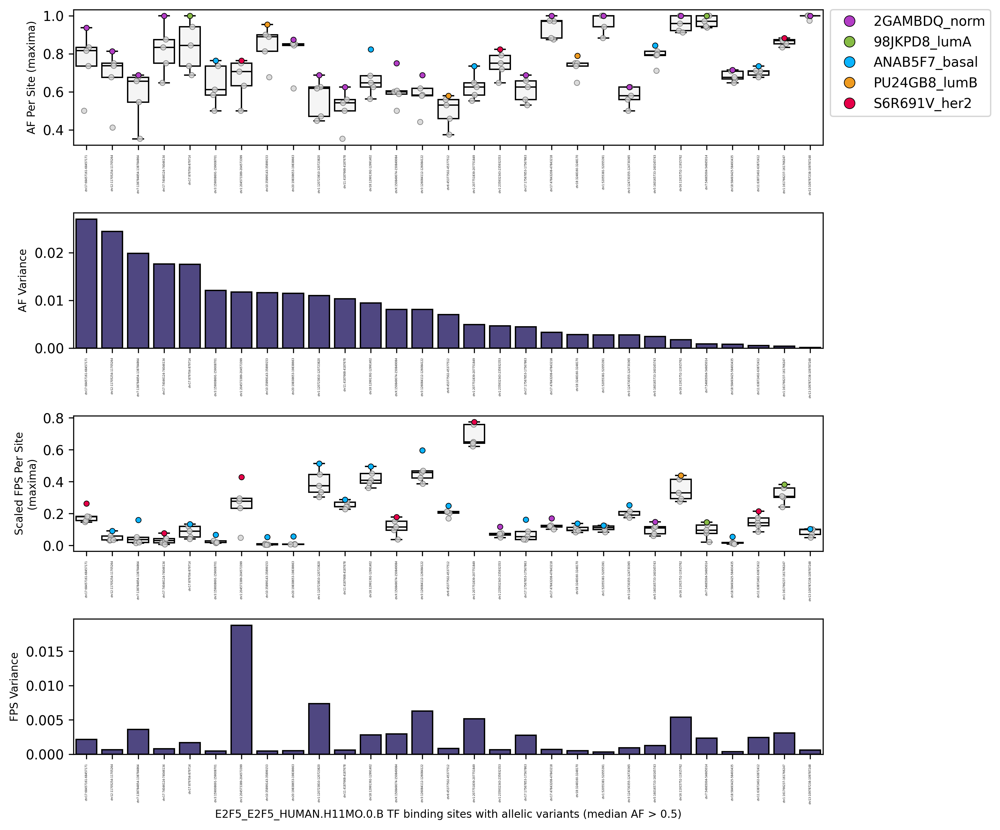

In [53]:
import textwrap
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(4, 1, 1)
sns.boxplot(x='region_id', y='AF', data=high_nzaf_outlie_filtsort, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='AF', data=max_af_raw_inv, hue='sample_id', palette=color_gray_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='dimgray', alpha=0.8)
sns.stripplot(x='region_id', y='AF', data=max_af_raw, hue='sample_id', palette=color_dict, size=4, jitter=True, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=2)
plt.xlabel('')
ylabel = textwrap.fill('AF Per Site (maxima)', width=20)
plt.ylabel(ylabel, fontsize=8)
# place legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)
plt.subplot(4, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=high_nzaf_outlie_filtsort, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=2)
plt.xlabel('')
plt.ylabel('AF Variance', fontsize=8)
  
plt.subplot(4, 1, 3)
sns.boxplot(x='region_id', y='FPS_scaled', data=high_nzaf_outlie_filtsort, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='FPS_scaled', data=max_fps_scaled_inv, hue='sample_id', palette=color_gray_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='dimgray', alpha=0.8)
sns.stripplot(x='region_id', y='FPS_scaled', data=max_fps_scaled, hue='sample_id', palette=color_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=2)
plt.xlabel('')
ylabel = textwrap.fill('Scaled FPS Per Site (maxima)', width=20)
plt.ylabel(ylabel, fontsize=8)

plt.subplot(4, 1, 4)
sns.barplot(x='region_id', y='FPS_scaled_var', data=high_nzaf_outlie_filtsort, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=2)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (median AF > 0.5)', fontsize=8)
plt.ylabel('FPS Variance', fontsize=8)
plt.subplots_adjust(hspace=0.5)

plt.show()

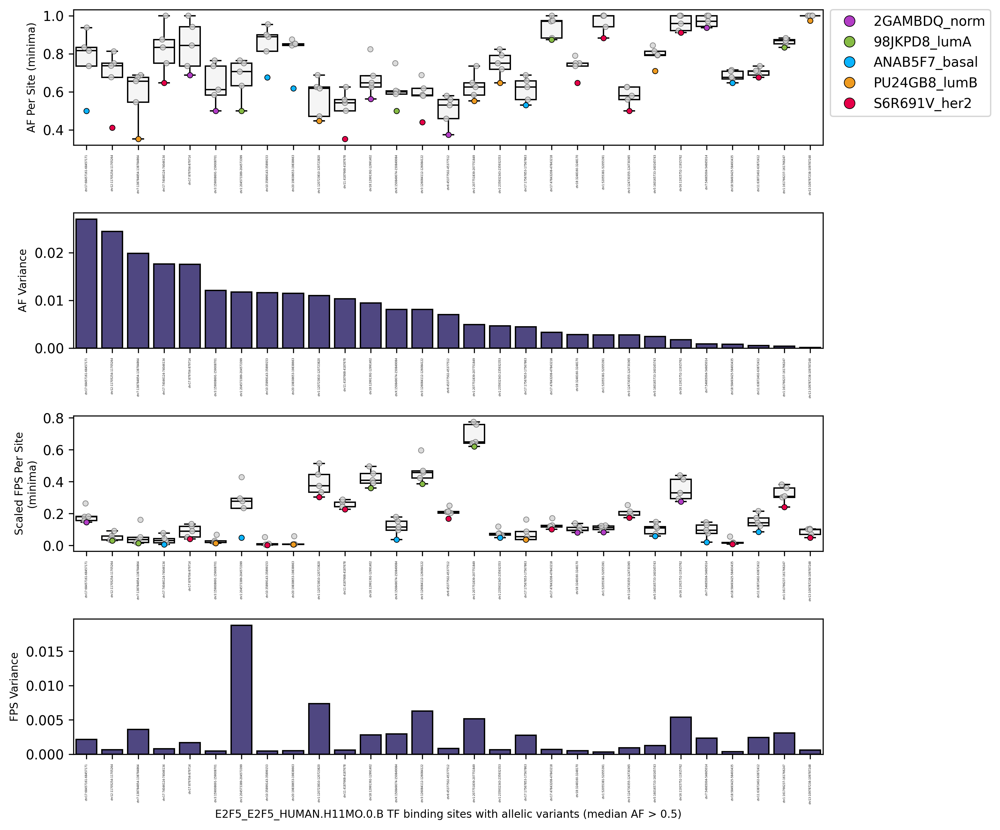

In [54]:
import textwrap
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(4, 1, 1)
sns.boxplot(x='region_id', y='AF', data=high_nzaf_outlie_filtsort, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='AF', data=min_af_raw_inv, hue='sample_id', palette=color_gray_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='dimgray', alpha=0.8)
sns.stripplot(x='region_id', y='AF', data=min_af_raw, hue='sample_id', palette=color_dict, size=4, jitter=True, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=2)
plt.xlabel('')
ylabel = textwrap.fill('AF Per Site (minima)', width=20)
plt.ylabel(ylabel, fontsize=8)
# place legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)
plt.subplot(4, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=high_nzaf_outlie_filtsort, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=2)
plt.xlabel('')
plt.ylabel('AF Variance', fontsize=8)
  
plt.subplot(4, 1, 3)
sns.boxplot(x='region_id', y='FPS_scaled', data=high_nzaf_outlie_filtsort, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='FPS_scaled', data=min_fps_scaled_inv, hue='sample_id', palette=color_gray_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='dimgray', alpha=0.8)
sns.stripplot(x='region_id', y='FPS_scaled', data=min_fps_scaled, hue='sample_id', palette=color_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=2)
plt.xlabel('')
ylabel = textwrap.fill('Scaled FPS Per Site (minima)', width=20)
plt.ylabel(ylabel, fontsize=8)

plt.subplot(4, 1, 4)
sns.barplot(x='region_id', y='FPS_scaled_var', data=high_nzaf_outlie_filtsort, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=2)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (median AF > 0.5)', fontsize=8)
plt.ylabel('FPS Variance', fontsize=8)
plt.subplots_adjust(hspace=0.5)

plt.show()

In [55]:
# quantify the number of filtered sites per sample_id
max_af_raw_subset = max_af_raw[['region_id', 'sample_id']]
max_af_raw_df = max_af_raw_subset.groupby('sample_id', observed=False)['region_id'].count().to_frame()

In [56]:
max_af_raw_df

,region_id
sample_id,
2GAMBDQ_norm,16
98JKPD8_lumA,2
ANAB5F7_basal,5
PU24GB8_lumB,3
S6R691V_her2,3


In [57]:
max_fps_scaled_subset = max_fps_scaled[['region_id', 'sample_id']]
max_fps_scaled_df = max_fps_scaled_subset.groupby('sample_id', observed=False)['region_id'].count().to_frame()

In [58]:
max_fps_scaled_df

,region_id
sample_id,
2GAMBDQ_norm,3
98JKPD8_lumA,2
ANAB5F7_basal,17
PU24GB8_lumB,1
S6R691V_her2,6


In [59]:
# load the counts
# site_counts = pd.read_csv('/scratch/users/ntu/suffiazi/outputs/tmp/plotting-parallel/output-data/concat_tables/1360_motifs_variable_site_counts-sorted.tsv', sep='\t')
site_counts = pd.read_csv('/data/bank/booth/msazizan/tobias-analysis-outputs/AF_FPS_plotting/1360_motifs_variable_site_counts-sorted.tsv', sep='\t')
site_counts

,motif_id,sample_id,max_AF_region_count,max_FPS_region_count
0,AHR_AHR_HUMAN.H11MO.0.B,S6R691V_her2,7,5
1,AHR_AHR_HUMAN.H11MO.0.B,PU24GB8_lumB,5,2
2,AHR_AHR_HUMAN.H11MO.0.B,ANAB5F7_basal,6,26
3,AHR_AHR_HUMAN.H11MO.0.B,98JKPD8_lumA,10,9
4,AHR_AHR_HUMAN.H11MO.0.B,2GAMBDQ_norm,15,1
...,...,...,...,...
6795,ZSCAN5C_M08390_2.00,PU24GB8_lumB,9,8
6796,ZSCAN5C_M08390_2.00,2GAMBDQ_norm,42,4
6797,ZSCAN5C_M08390_2.00,98JKPD8_lumA,24,26
6798,ZSCAN5C_M08390_2.00,S6R691V_her2,15,23


In [60]:
# sort sample_id column naturally, by motif_id grouping
site_counts_sorted = site_counts.sort_values(by=['motif_id', 'sample_id'])
site_counts_sorted

,motif_id,sample_id,max_AF_region_count,max_FPS_region_count
4,AHR_AHR_HUMAN.H11MO.0.B,2GAMBDQ_norm,15,1
3,AHR_AHR_HUMAN.H11MO.0.B,98JKPD8_lumA,10,9
2,AHR_AHR_HUMAN.H11MO.0.B,ANAB5F7_basal,6,26
1,AHR_AHR_HUMAN.H11MO.0.B,PU24GB8_lumB,5,2
0,AHR_AHR_HUMAN.H11MO.0.B,S6R691V_her2,7,5
...,...,...,...,...
6796,ZSCAN5C_M08390_2.00,2GAMBDQ_norm,42,4
6797,ZSCAN5C_M08390_2.00,98JKPD8_lumA,24,26
6799,ZSCAN5C_M08390_2.00,ANAB5F7_basal,10,39
6795,ZSCAN5C_M08390_2.00,PU24GB8_lumB,9,8


In [61]:
# sum the total filtered sites where FPS variance is considered outliers, based on AF variance 
sumsite_af_sorted_df = site_counts_sorted.groupby('motif_id')['max_AF_region_count'].sum().sort_values(ascending=False).to_frame()
sumsite_af_sorted_df

,max_AF_region_count
motif_id,
ZNF287_M07590_2.00,2183
ZNF235_M07605_2.00,2120
ZNF432_M07773_2.00,1848
ZFP28_M08378_2.00,1840
ZNF487_M07782_2.00,1837
...,...
PRRX2_PRRX2_HUMAN.H11MO.0.C,27
NOBOX_NOBOX_HUMAN.H11MO.0.C,24
ZNF547_M07600_2.00,22


In [62]:
# set categorical order for motif_id
site_counts_sorted['motif_id'] = pd.Categorical(site_counts_sorted['motif_id'], categories=sumsite_af_sorted_df.index, ordered=True)
site_counts_sorted = site_counts_sorted.sort_values(['motif_id', 'sample_id'])
site_counts_sorted

,motif_id,sample_id,max_AF_region_count,max_FPS_region_count
5350,ZNF287_M07590_2.00,2GAMBDQ_norm,751,151
5351,ZNF287_M07590_2.00,98JKPD8_lumA,488,677
5352,ZNF287_M07590_2.00,ANAB5F7_basal,313,924
5353,ZNF287_M07590_2.00,PU24GB8_lumB,340,137
5354,ZNF287_M07590_2.00,S6R691V_her2,291,294
...,...,...,...,...
6274,ZNF669_M08262_2.00,2GAMBDQ_norm,2,0
6273,ZNF669_M08262_2.00,98JKPD8_lumA,3,0
6272,ZNF669_M08262_2.00,ANAB5F7_basal,2,4
6271,ZNF669_M08262_2.00,PU24GB8_lumB,1,4


In [63]:
# Pivot the DataFrame so that each 'sample_id' is a column
pivot_df = site_counts_sorted.pivot(index='motif_id', columns='sample_id', values='max_AF_region_count').fillna(0)
pivot_df

sample_id,2GAMBDQ_norm,98JKPD8_lumA,ANAB5F7_basal,PU24GB8_lumB,S6R691V_her2
motif_id,,,,,
ZNF287_M07590_2.00,751,488,313,340,291
ZNF235_M07605_2.00,737,468,314,325,276
ZNF432_M07773_2.00,624,377,294,260,293
ZFP28_M08378_2.00,624,386,266,299,265
ZNF487_M07782_2.00,642,394,257,285,259
...,...,...,...,...,...
PRRX2_PRRX2_HUMAN.H11MO.0.C,12,7,1,2,5
NOBOX_NOBOX_HUMAN.H11MO.0.C,10,3,7,3,1
ZNF547_M07600_2.00,6,6,3,3,4


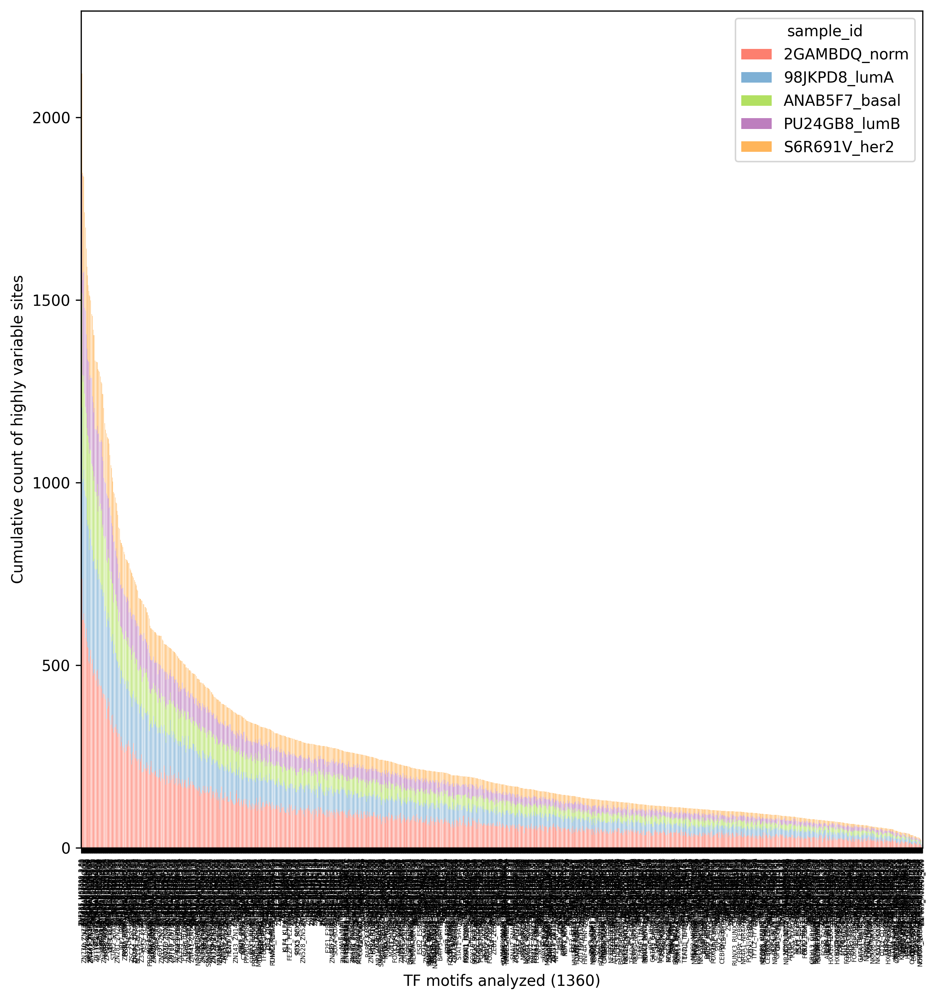

In [64]:
# Pivot the DataFrame so that each 'sample_id' is a column
pivot_df = site_counts_sorted.pivot(index='motif_id', columns='sample_id', values='max_AF_region_count').fillna(0)

# Create a new figure with high resolution
_, ax = plt.subplots(figsize=(10,10), dpi=300)

# Plot the DataFrame using the 'plot' function from pandas
pivot_df.plot(kind='bar', stacked=True, color=springpastel, ax=ax)

plt.legend(title='sample_id')
plt.xticks(rotation=90, fontsize=4)
plt.ylabel('Cumulative count of highly variable sites', fontsize=10)
plt.xlabel(f'TF motifs analyzed ({pivot_df.index.nunique()})', fontsize=10)
plt.show()

In [65]:
# truncate df to just top 5% motifs
# 1360 motifs * 0.05 = 68 motifs
site_counts_sorted_top5 = site_counts_sorted.iloc[:(68*5)].copy().reset_index(drop=True)
site_counts_sorted_top5

,motif_id,sample_id,max_AF_region_count,max_FPS_region_count
0,ZNF287_M07590_2.00,2GAMBDQ_norm,751,151
1,ZNF287_M07590_2.00,98JKPD8_lumA,488,677
2,ZNF287_M07590_2.00,ANAB5F7_basal,313,924
3,ZNF287_M07590_2.00,PU24GB8_lumB,340,137
4,ZNF287_M07590_2.00,S6R691V_her2,291,294
...,...,...,...,...
335,ZNF570_M07635_2.00,2GAMBDQ_norm,279,27
336,ZNF570_M07635_2.00,98JKPD8_lumA,189,129
337,ZNF570_M07635_2.00,ANAB5F7_basal,116,525
338,ZNF570_M07635_2.00,PU24GB8_lumB,128,25


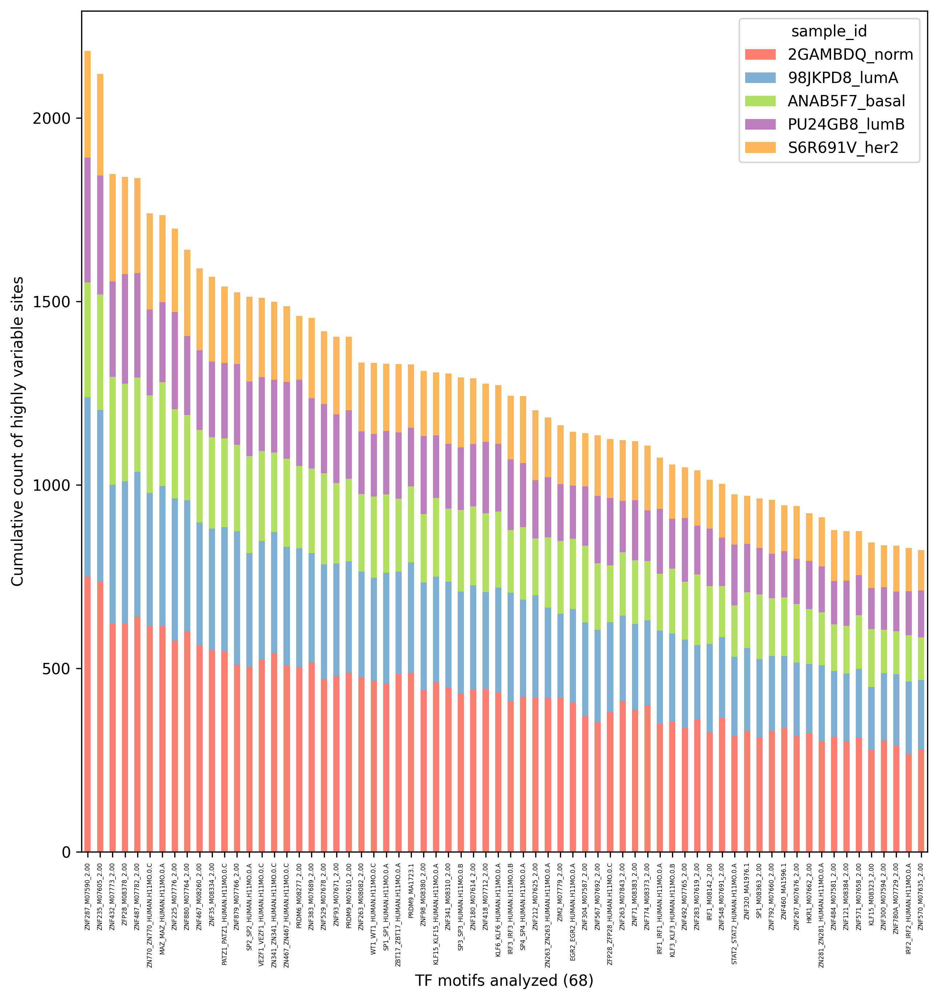

In [66]:
# Pivot the DataFrame so that each 'sample_id' is a column
pivot_df_trunc = site_counts_sorted_top5.pivot(index='motif_id', columns='sample_id', values='max_AF_region_count').fillna(0)

# Create a new figure with high resolution
_, ax = plt.subplots(figsize=(10,10), dpi=300)

# Plot the DataFrame using the 'plot' function from pandas
pivot_df_trunc.plot(kind='bar', stacked=True, color=springpastel, ax=ax)

plt.legend(title='sample_id')
plt.xticks(rotation=90, fontsize=4)
plt.ylabel('Cumulative count of highly variable sites', fontsize=10)
plt.xlabel(f'TF motifs analyzed ({pivot_df_trunc.index.nunique()})', fontsize=10)
plt.show()

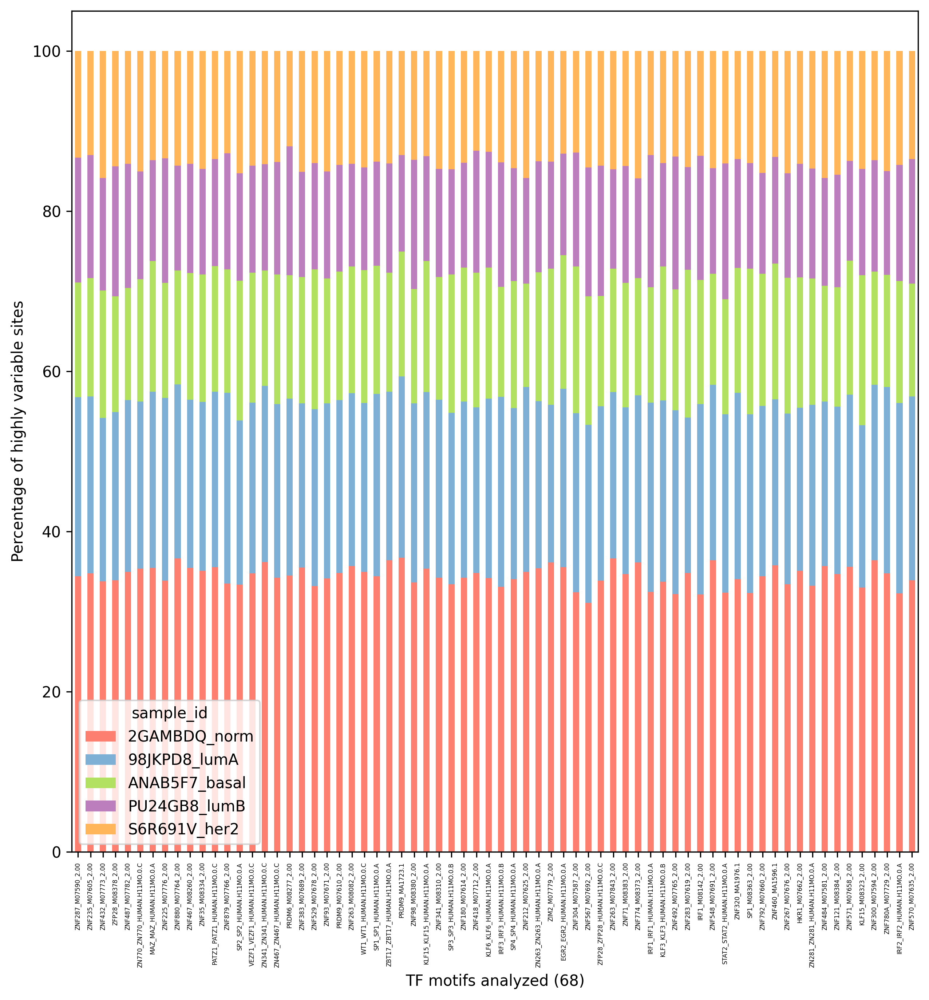

In [67]:
# Calculate the sum for each 'motif_id'
sums = pivot_df_trunc.sum(axis=1)

# Divide each 'max_AF_region_count' by the sum and multiply by 100 to get percentages
pivot_df_trunc = pivot_df_trunc.div(sums, axis=0) * 100

# Create a new figure with high resolution
_, ax = plt.subplots(figsize=(10,10), dpi=300)

# Plot the DataFrame using the 'plot' function from pandas
pivot_df_trunc.plot(kind='bar', stacked=True, color=springpastel, ax=ax)

plt.legend(title='sample_id')
plt.xticks(rotation=90, fontsize=4)
plt.ylabel('Percentage of highly variable sites', fontsize=10)
plt.xlabel(f'TF motifs analyzed ({pivot_df_trunc.index.nunique()})', fontsize=10)
plt.show()

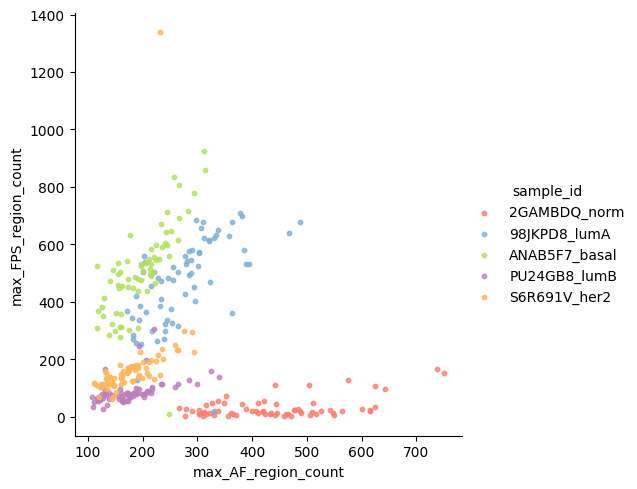

In [68]:
# plot jointplot of site_counts_sorted_top5
sns.lmplot(x='max_AF_region_count', y='max_FPS_region_count', data=site_counts_sorted_top5, hue ='sample_id', fit_reg=False, palette=springpastel, scatter_kws={'s': 10})
